In [46]:
NAME = "Md. Moynul Asik Moni"
ID = "19101189"
COLLABORATORS_ID = ["", ""]

# WALKTHROUGH
Watch [this](https://youtu.be/96Ssek9nLRs) how-to tutorial first

In [47]:
# ---------------------------------------------------------------------
# ---------------------------------------------------------------------
# !!!!!!!!!!!!!!!!! WATCH THE WALKTHROUGH VIDEO FIRST !!!!!!!!!!!!!!!!!
# ---------------------------------------------------------------------
# ---------------------------------------------------------------------

# Necessary library import

In [48]:
import numpy as np 
from skimage import io, color, exposure
import matplotlib.pyplot as plt 

# Task 1 - Basic Image Operation

import your image or any photo taken by you (`sample.jpeg`) as a numpy array, save it in the varaible `I`

remember your image name MUST be `sample.jpeg`. 

Make sure the height and the width of the image is **smaller than 1000 pixels**.

In [49]:
#I = None # Replace None with appropriate function call line


# find the height and the width of the image
#H = None # should contain height
#W = None # should contain width
#print("Height is", H)
#print("Width is", W)

### BEGIN SOLUTION
I = io.imread("sample.jpeg")

H = I.shape[0] 
W = I.shape[1] 
print("Height is", H)
print("Width is", W)
### END SOLUTION

Height is 640
Width is 430


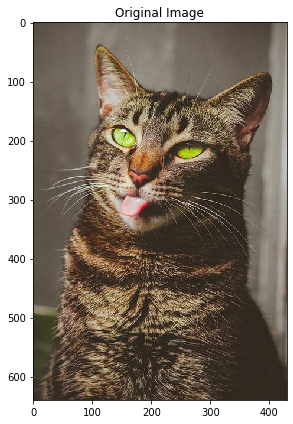

In [50]:
# Normalize the image so that the gray scales are between 0 and 1. Save it to I and display the image
#I = None 

### BEGIN SOLUTION
I = I/255

plt.rcParams["figure.figsize"] = (6,6)
plt.title("Original Image")
io.imshow(I)

### END SOLUTION

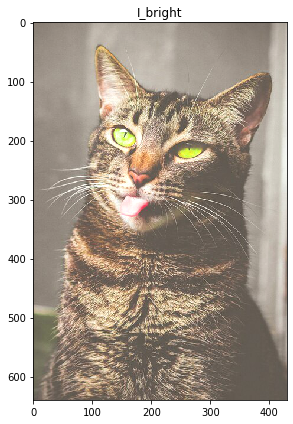

In [51]:
# Increase the brightness of the image without changing the contrast. 
# Save the resulting image in I_bright and display it.
#I_bright = None 

### BEGIN SOLUTION
I_bright = np.clip(I+0.2,0,1)

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_bright")
io.imshow(I_bright)
### END SOLUTION

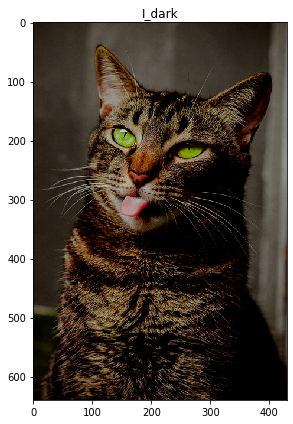

In [52]:
# Decrease the brightness of the image without changing the contrast. 
# Save the resulting image in I_dark and display it.
#I_dark = None 

### BEGIN SOLUTION
I_dark = np.clip(I-0.2,0,1)

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_dark")
io.imshow(I_dark)
### END SOLUTION

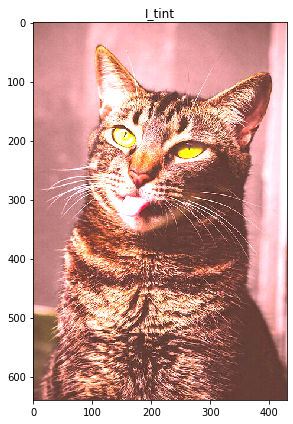

In [53]:
# Multiply the three channels of image I with three DIFFERENT numbers between 0.3 and 3 
# Save the resulting image in I_tint and display it.
# The resulting image should have some color shift
#I_tint = None

# HINT: 
# I_tint = np.zeros(I.shape)
# I_tint[:, :, 0] =  ..... I[:, :, 0].....
# ......

### BEGIN SOLUTION
I_tint = np.zeros(I.shape)


I_tint[:, :, 0] = np.random.uniform(0.3,3)*I[:, :, 0]
I_tint[:, :, 1] = np.random.uniform(0.3,3)*I[:, :, 1]
I_tint[:, :, 2] = np.random.uniform(0.3,3)*I[:, :, 2]
I_tint = np.clip(I_tint, 0, 1)

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_tint")
io.imshow(I_tint)
### END SOLUTION

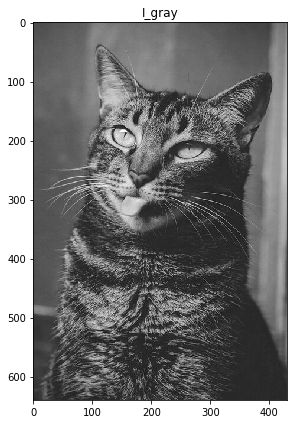

In [54]:
# Convert the image into a grayscale image.
# Save it to I_gray and display it
#I_gray = None

### BEGIN SOLUTION
I_gray = color.rgb2gray(I)

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_gray")
io.imshow(I_gray)
### END SOLUTION

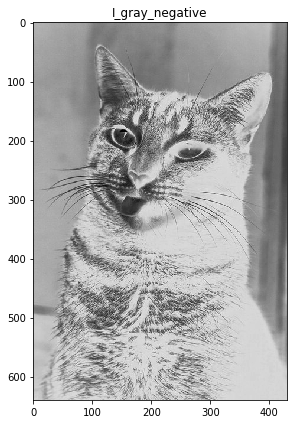

In [55]:
# Display the negative of the grayscale image

### BEGIN SOLUTION
I_gray_negative = 1 - I_gray

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_gray_negative")
io.imshow(I_gray_negative)
### END SOLUTION

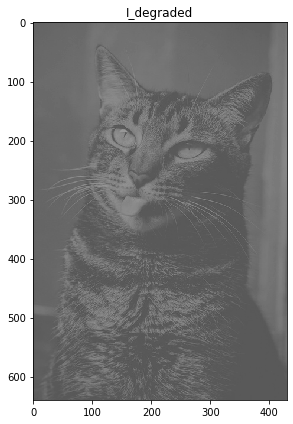

In [56]:
# Artificially degrade the **grayscale image** by reducing it contrast
# You can do so by recaling the gray values and concentrating them in a narrow range,
# say between 0.3 and 0.6.
# Save the image as I_degraded and display it
# HINT: SEE lec-4-demo-codes

#I_degraded = None

### BEGIN SOLUTION
I_degraded = exposure.rescale_intensity(I_gray, in_range=(0,1), out_range=(0.3,0.6))

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_degraded")
io.imshow(I_degraded )
### END SOLUTION

In [57]:
# Complete the following function to perform Piecewise Linear Contrast stretching
# That is, implement the map shown in Slide 17 of Lecture 3

# Prototype: piecewise_contrast_stretch(I_gray, r1, r2, s1, s2)
# Assuming both input and output images are normalized between 0 and 1

def piecewise_contrast_stretch(I, r1, r2, s1, s2):
    #pass 
    # Write your code here
    #I_stretched = None # replace with appropriate code
    #return I_stretched 

    ### BEGIN SOLUTION
    I_stretched = np.zeros(I.shape)

    s_max = 0
    s_min = 0
    r_max = 0
    r_min = 0

    for x in range(I_stretched.shape[0]):
      for y in range(I_stretched.shape[1]):
        
        if 0 <= I[x][y] < r1:
          r_min, r_max, s_min, s_max = 0, r1, 0, s1
        elif r1 <= I[x][y] < r2:
          r_min, r_max, s_min, s_max = r1, r2, s1, s2
        elif r2 <= I[x][y] <= 1:
          r_min, r_max, s_min, s_max = r2, 1, s2, 1

        I_stretched[x][y] = ((I[x][y] - r_min) * ((s_max - s_min) / (r_max - r_min)))+s_min

    return I_stretched
    ### END SOLUTION



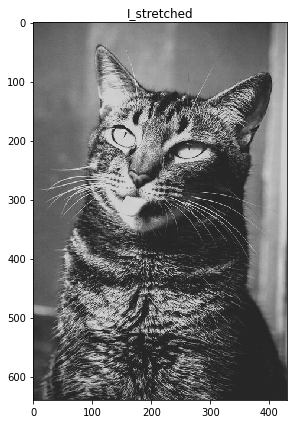

In [58]:
# To test your implementation, contrast strech the degraded image I_degrade
#r1 = None
#r2 = None
#s1 = None
#s2 = None
#I_stretched = piecewise_contrast_stretch(I_degraded, r1, r2, s1, s2)

# Display the strtched image

### BEGIN SOLUTION

#hist, bins_hist = exposure.histogram(I_degraded.ravel(), nbins=256, normalize=True)
##plt.plot(bins_hist, hist, 'k')
#plt.xlabel("pixel values")

#plt.ylabel("probability")
r1 = 0.35
r2 = 0.50
s1 = 0.15
s2 = 0.8
I_stretched = piecewise_contrast_stretch(I_degraded, r1, r2, s1, s2)

plt.rcParams["figure.figsize"] = (6,6)
plt.title("I_stretched")
io.imshow(I_stretched)
### END SOLUTION






# Task 2 - Histogram and Equalization

In [59]:
#....................................Helper function for efficient codding and visualization of output.........................


def plot_img_hist_cdf(I,title='Image',color_hist=False, nbins=256, normalize=False, plot_cdf=True):


   
    plt.rcParams["figure.figsize"] = (15,10)
    plt.subplot(1, 2, 1)
    io.imshow(I)
    plt.axis("off")
    plt.title(title)
    
    plt.subplot(1, 2, 2)
    if color_hist:
      color=['r', 'g', 'b']
      plt.title(title+' histgram and cdf')
      for i in range(3):
        hist, bins_hist = exposure.histogram(I[:, :, i].ravel(), nbins=nbins, normalize=normalize)
        plt.plot(bins_hist, hist, color[i])
        
      plt.xlabel("pixel values")
      if normalize:
        plt.ylabel("probability")
      else:
       
        plt.ylabel("count")
      xmax = 1 if I.max() <= 1 else 255
      plt.xlim([0, xmax])
      plt.legend(['Red channel', 'Green channel', 'Blue channel'])

      if plot_cdf:
        plt.twinx()
        for i in range(3):
          cdf, bins_cdf = exposure.cumulative_distribution(I[:, :, i].ravel(), nbins=256)
          plt.plot(bins_cdf, cdf, color[i]+'--', lw=2)
      
        plt.ylabel("percentage")
    else:
      
      hist, bins_hist = exposure.histogram(I.ravel(), nbins=nbins, normalize=normalize)
      plt.plot(bins_hist, hist, 'k')
      plt.xlabel("pixel values")
      if normalize:
        plt.ylabel("probability")
      else:
        plt.ylabel("count")
      xmax = 1 if I.max() <= 1 else 255
      plt.xlim([0, xmax])
      if plot_cdf:
        cdf, bins_cdf = exposure.cumulative_distribution(I.ravel(), nbins=256)
        plt.twinx()
        plt.plot(bins_cdf, cdf, 'r', lw=2)
        plt.ylabel("percentage")
        plt.title(title+" histogram and cdf")
      else:
        plt.title(title+' histgram')
    plt.tight_layout()




def plot_clng_img_hist(I_real, I_improved, t1, t2, nbins=256, normalize=False, plot_cdf=True):
  plt.rcParams["figure.figsize"] = (15,10)
  plt.subplot(2, 2, 1)
  plt.axis("off")
  plt.title(t1)
  io.imshow(I_real)
  

  plt.subplot(2, 2, 2)
  color=['r', 'g', 'b']
  plt.title(t1+' histgram and cdf')
  for i in range(3):
    hist, bins_hist = exposure.histogram(I_real[:, :, i].ravel(), nbins=nbins, normalize=normalize)
    plt.plot(bins_hist, hist, color[i])
        
  plt.xlabel("pixel values")
  if normalize:
    plt.ylabel("probability")
  else:
    plt.ylabel("count")
  xmax = 1 if I_real.max() <= 1 else 255
  plt.xlim([0, xmax])
  plt.legend(['Red channel', 'Green channel', 'Blue channel'])

  if plot_cdf:
    plt.twinx()
    for i in range(3):
      cdf, bins_cdf = exposure.cumulative_distribution(I_real[:, :, i].ravel(), nbins=256)
      plt.plot(bins_cdf, cdf, color[i]+'--', lw=2)

  plt.subplot(2, 2, 3)
  plt.axis("off")
  plt.title(t2)
  io.imshow(I_improved)
  
  plt.subplot(2, 2, 4)
  color=['r', 'g', 'b']
  plt.title(t2+' histgram and cdf')
  for i in range(3):
    hist, bins_hist = exposure.histogram(I_improved[:, :, i].ravel(), nbins=nbins, normalize=normalize)
    plt.plot(bins_hist, hist, color[i])
        
  plt.xlabel("pixel values")
  if normalize:
    plt.ylabel("probability")
  else:
    plt.ylabel("count")
  xmax = 1 if I_improved.max() <= 1 else 255
  plt.xlim([0, xmax])
  plt.legend(['Red channel', 'Green channel', 'Blue channel'])

  if plot_cdf:
    plt.twinx()
    for i in range(3):
      cdf, bins_cdf = exposure.cumulative_distribution(I_improved[:, :, i].ravel(), nbins=256)
      plt.plot(bins_cdf, cdf, color[i]+'--', lw=2)

    
  


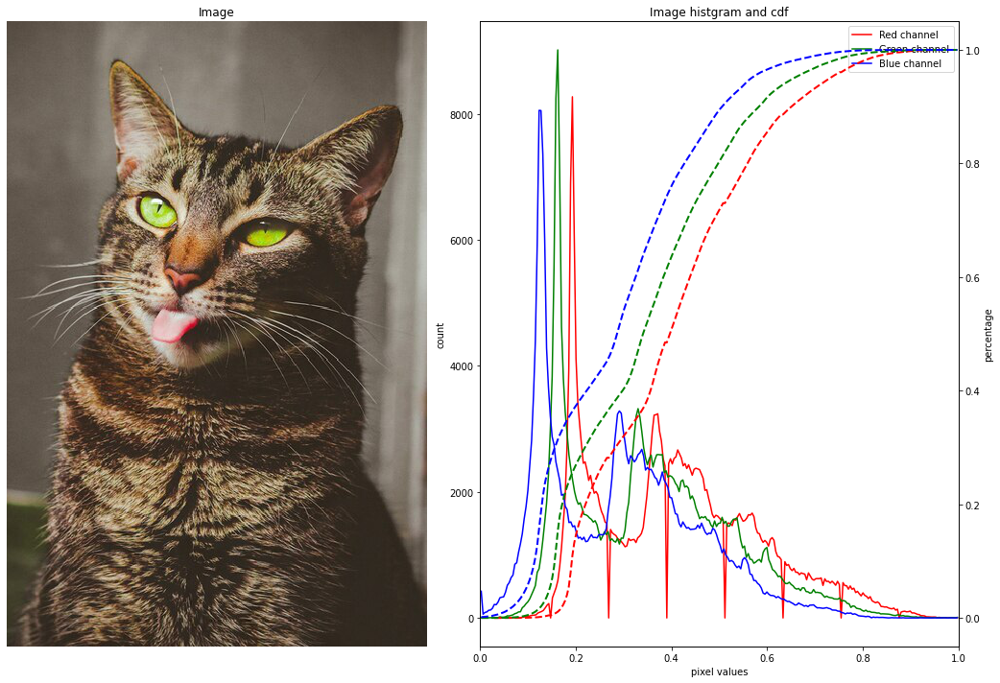

In [60]:
# Plot the Image and its histogram + cdf of the original image I
# Note that it is a color image, so it will have three different histograms

### BEGIN SOLUTION
plot_img_hist_cdf(I,'Image',True, 256, False,True)
### END SOLUTION

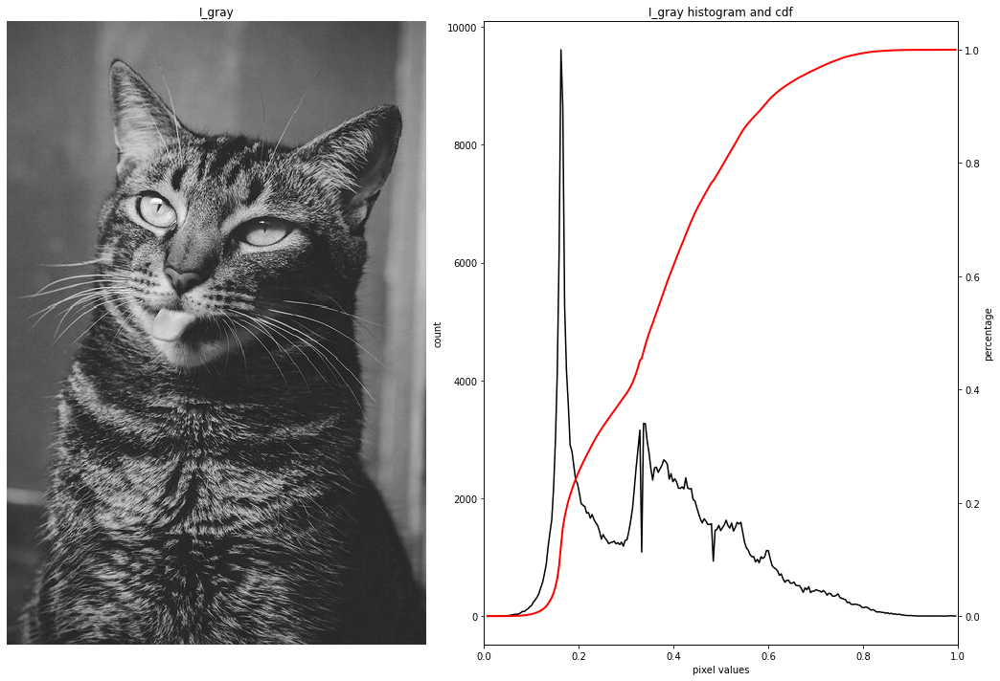

In [61]:
# Plot the Image and its histogram + cdf of the grayscale image I_gray

### BEGIN SOLUTION
plot_img_hist_cdf(I_gray,'I_gray',False,256, False, True)
### END SOLUTION

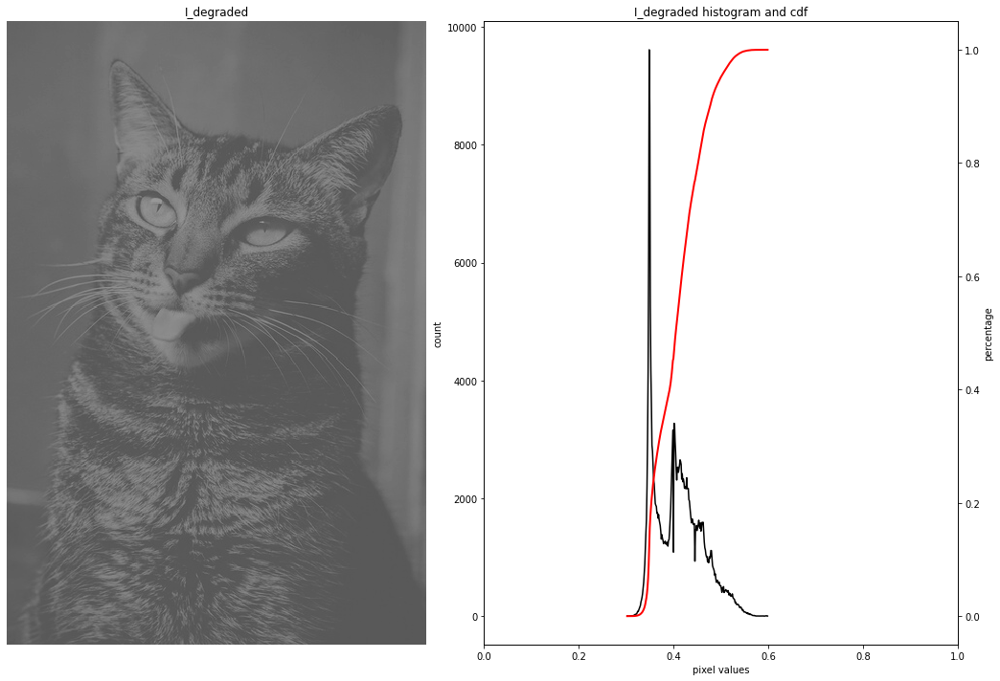

In [62]:
# Plot the Image and its histogram + cdf of the degraded image I_degraded

### BEGIN SOLUTION
plot_img_hist_cdf(I_degraded,'I_degraded',False,256, False, True)
### END SOLUTION

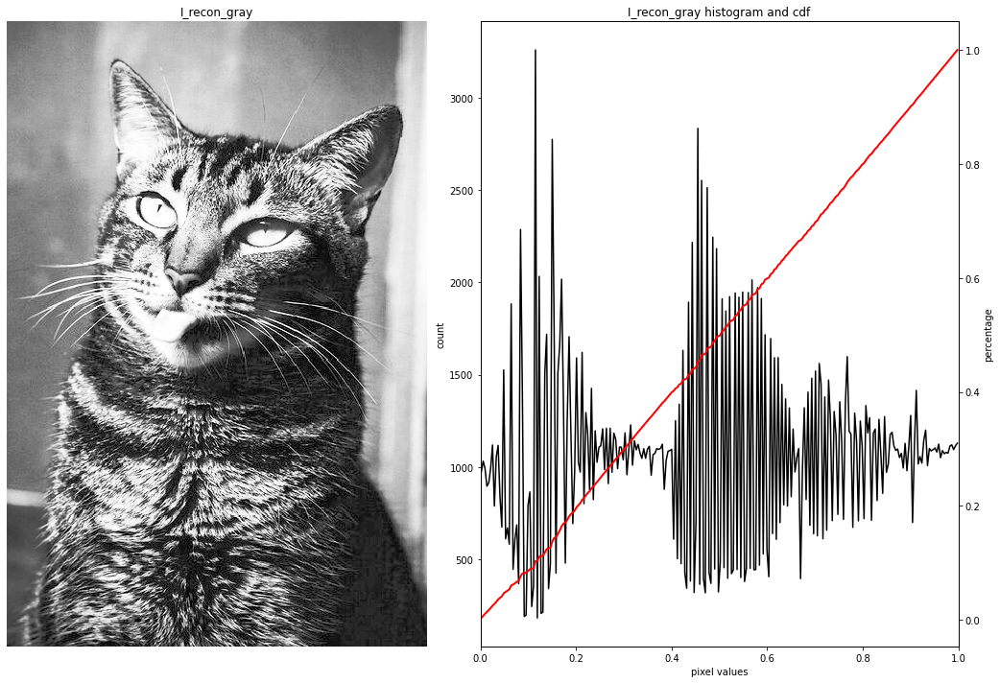

In [63]:
# Equalize the histogram of the degraded image I_degraded
# Save the result in I_recon_gray, display the image along with its histogram

#I_recon_gray = None

### BEGIN SOLUTION
I_recon_gray = exposure.equalize_hist(I_degraded)
plot_img_hist_cdf(I_recon_gray,'I_recon_gray',False, 256, False,True)


### END SOLUTION

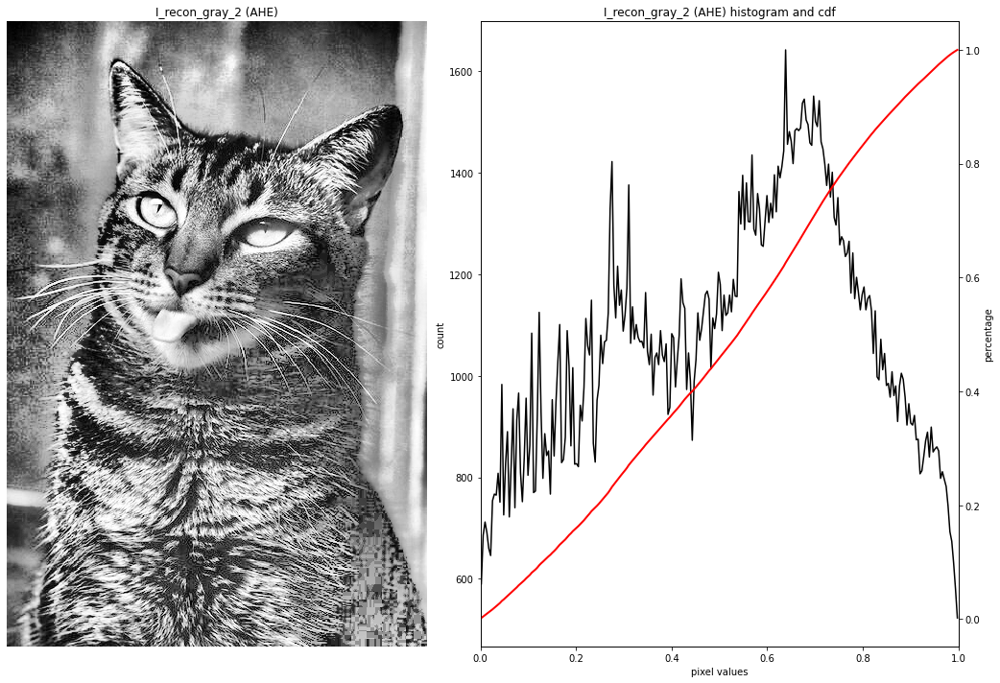

In [64]:
# Equalize the histogram of the degraded image I_degraded using AHE
# Save the result in I_recon_gray_2, display the image along with its histogram

#I_recon_gray_2 = None

### BEGIN SOLUTION
I_recon_gray_2 = exposure.equalize_adapthist(I_degraded, kernel_size=(100, 100), clip_limit=0)
plot_img_hist_cdf(I_recon_gray_2,'I_recon_gray_2 (AHE)',False, 256, False,True)
### END SOLUTION

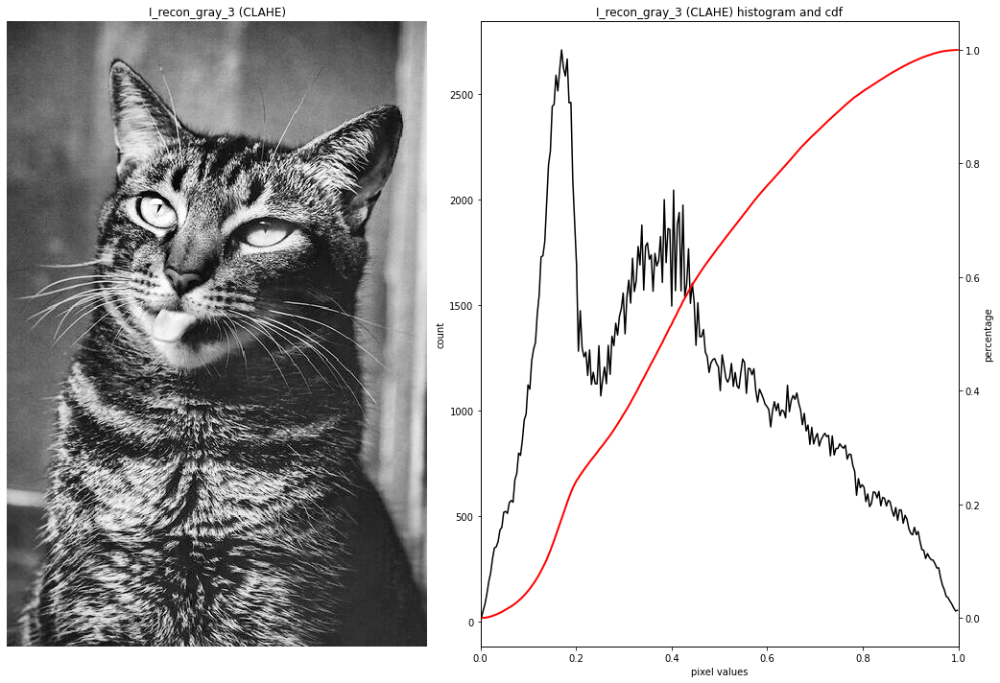

In [65]:
# Equalize the histogram of the degraded image I_degraded using CLAHE
# Save the result in I_recon_gray_2, display the image along with its histogram

#I_recon_gray_3 = None

### BEGIN SOLUTION
I_recon_gray_3 = exposure.equalize_adapthist(I_degraded, kernel_size=(100, 100), clip_limit=0.01)
plot_img_hist_cdf(I_recon_gray_3,'I_recon_gray_3 (CLAHE)',False, 256, False,True)
### END SOLUTION

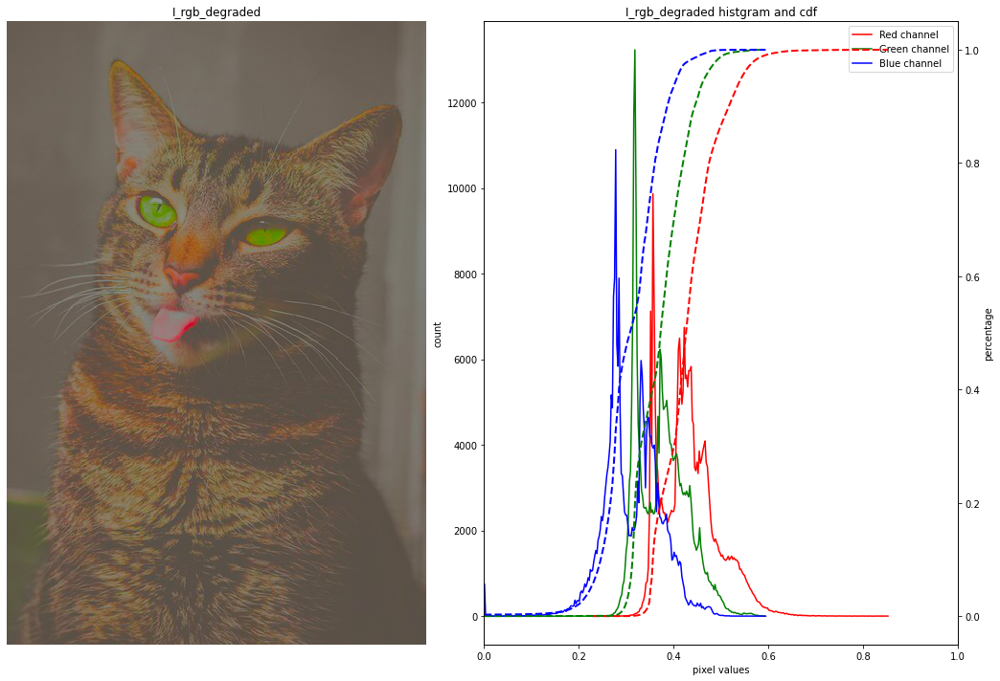

In [67]:
# Artificially degrade the original **RGB image** by reducing it contrast
# You can do so by recaling the values of the L channel (in LAB color space) 
# and concentrating them in a narrow range, say between 0.3 and 0.6.
# Save the image as I_rgb_degraded and display it
# HINT: SEE lec-4-demo-codes

#I_rgb_degraded = None

### BEGIN SOLUTION

Ilab = color.rgb2lab(I)
Ilab[:, :, 0] = Ilab[:, :, 0]/100
I_degraded_l = exposure.rescale_intensity(Ilab[:, :, 0], in_range=(0, 1), out_range=(0.3, 0.6))
Ilab[:, :, 0] = I_degraded_l*100

I_rgb_degraded =color.lab2rgb(Ilab)

plot_img_hist_cdf(I_rgb_degraded,'I_rgb_degraded',True, 256, False,True)
### END SOLUTION

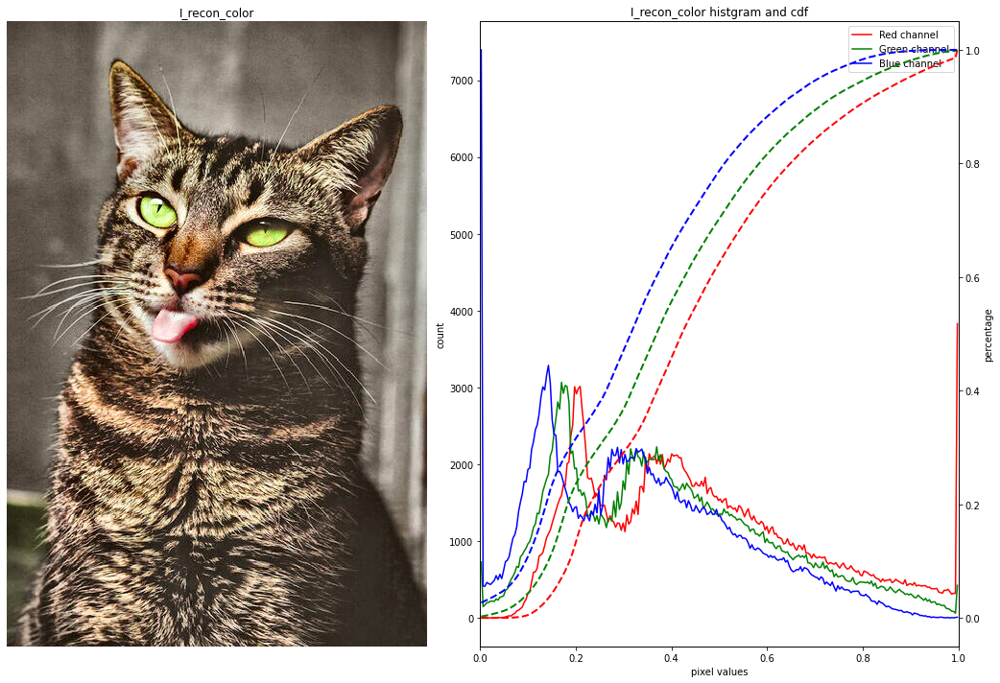

In [69]:
# Equalize the histogram of the degraded color image I_rgb_degraded using CLAHE
# Save the result in I_recon_color, display the image along with its histogram
# HINT: You have to convert to LAB first
# See the lecture and lecture-4-demo-codes

#I_recon_color = None

### BEGIN SOLUTION

Ilab = color.rgb2lab(I_rgb_degraded)

Ilab[:, :, 0] = Ilab[:, :, 0]/100
I_clahe = exposure.equalize_adapthist(Ilab[:, :, 0], kernel_size=(50, 50), clip_limit=0.01)

Ilab[:, :, 0] = 100*I_clahe
I_recon_color = color.lab2rgb(Ilab)

plot_img_hist_cdf(I_recon_color,'I_recon_color',True, 256, False,True)


### END SOLUTION

# Task 3 - Open Ended

In [73]:
# There are four degraded images in this directory
# challenge-1.jpeg = very dark
# challenge-2.jpeg = washed out/foggy
# challenge-3.jpeg = alternative black bars
# challenge-4.jpeg = discoloured (the image is actually a color image) [BONUS]

# Your task is to improve these images using 
# contrast stretching, histogram equalization, AHE or CLAHE
# try different combination of parameter settings to see which produces the best result



### BEGIN SOLUTION

c1_img = io.imread('challenge-1.jpg')
c2_img = io.imread('challenge-2.jpg')
c3_img = io.imread('challenge-3.jpg')
c4_img = io.imread('challenge-4.jpg')

c1_img = c1_img/255
c2_img = c2_img/255
c3_img = c3_img/255
c4_img = c4_img/255


/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


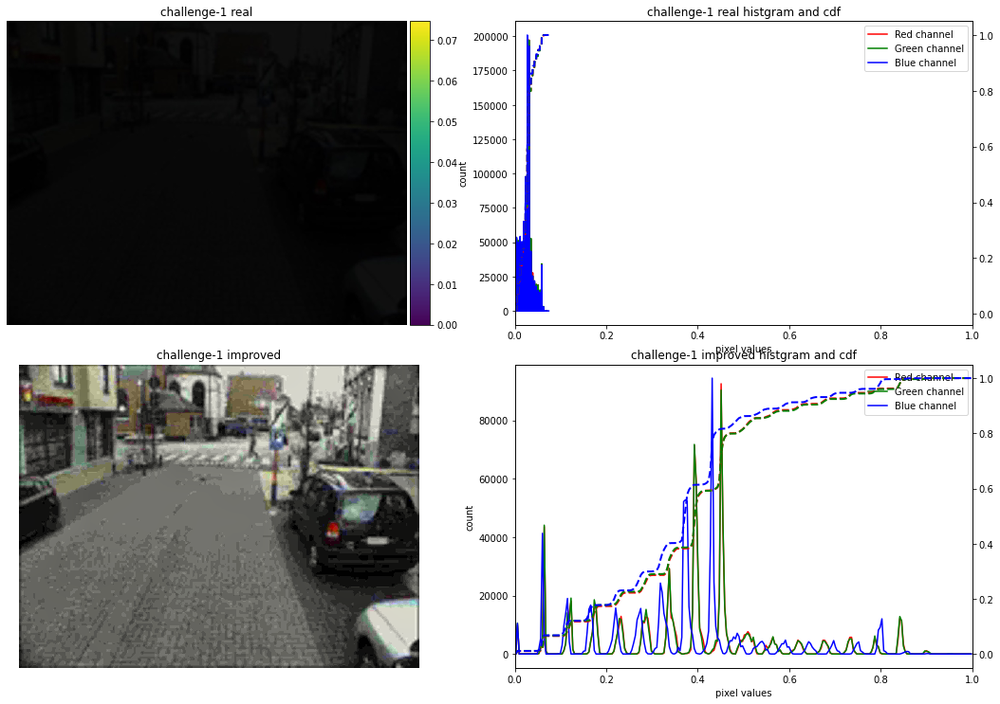

In [74]:
#for challenge-1
c1_img_r = c1_img.copy()

for i in range(3):
  c1_img_r[:, :, i] = exposure.equalize_adapthist(c1_img_r[:, :, i], kernel_size=(80, 80), clip_limit=0.01)

plot_clng_img_hist(c1_img, c1_img_r, 'challenge-1 real', 'challenge-1 improved', nbins=256, normalize=False, plot_cdf=True)

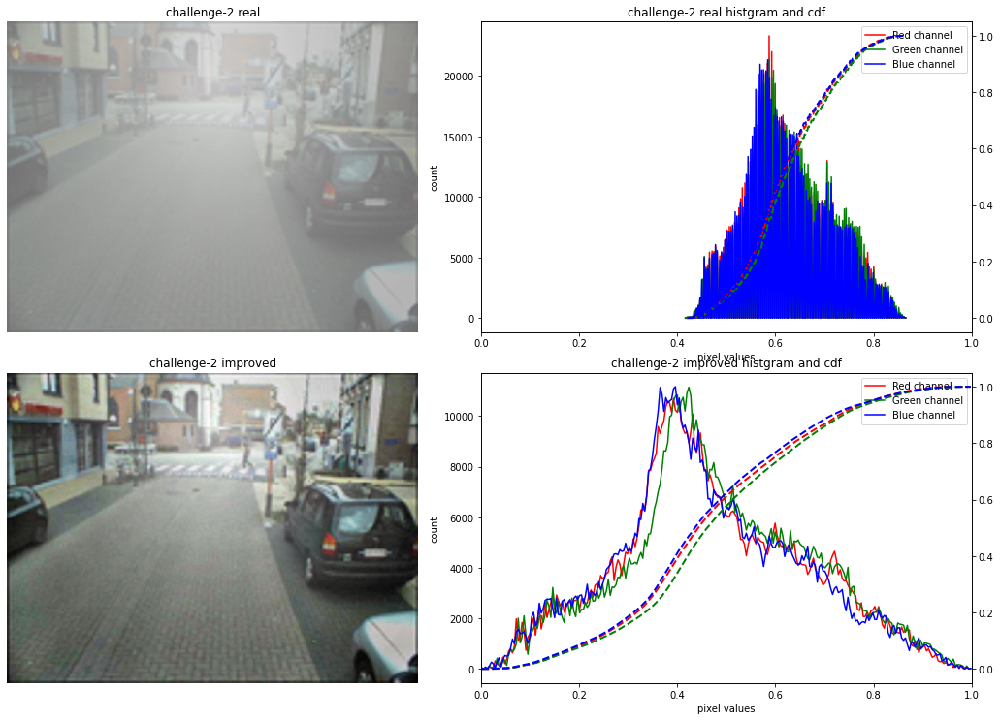

In [75]:
#for challenge-2
c2_img_r = c2_img.copy()

for i in range(3):
  c2_img_r[:, :, i] = exposure.equalize_adapthist(c2_img_r[:, :, i], kernel_size=(100, 100), clip_limit=0.01)


plot_clng_img_hist(c2_img, c2_img_r, 'challenge-2 real', 'challenge-2 improved', nbins=256, normalize=False, plot_cdf=True)

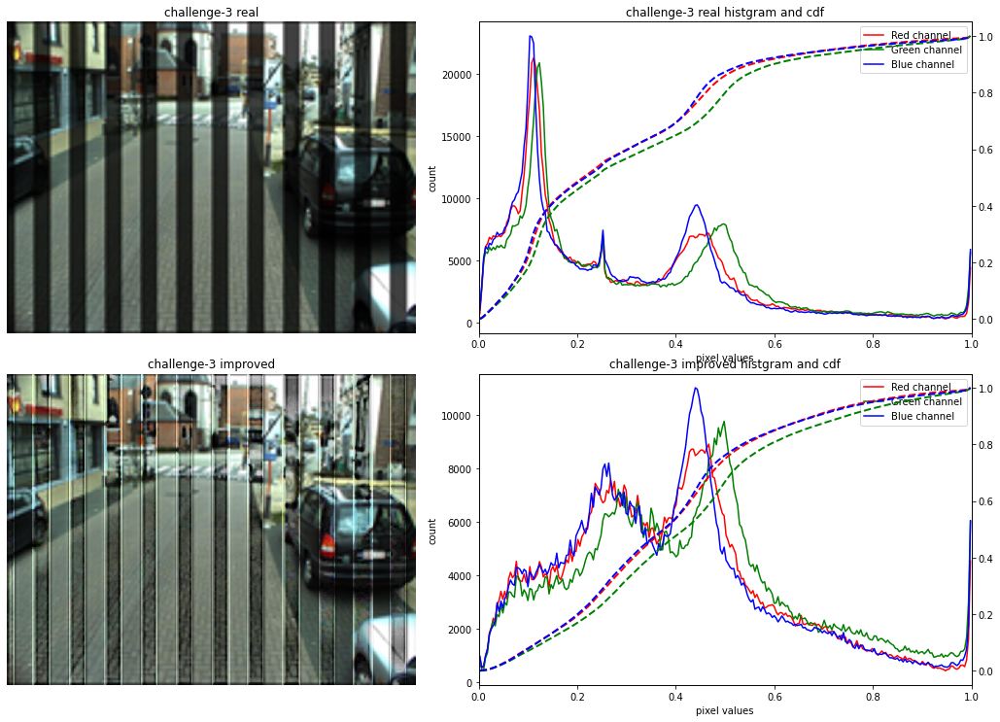

In [76]:
#for challenge-3


c3_img_r = c3_img.copy()

#xp = [i for i in range(0,c3_img_r.shape[1],30)]

#plt.title("c3_img_r")
#plt.xticks(xp)
#io.imshow(c3_img_r)

d = {1:(0,22),2:(70,118),3:(170,215),4:(265,315),5:(365,410),6:(460,505),7:(560,610),8:(655,700),9:(750,800),10:(850,895),11:(945,1000),12:(1045,1090)}


for i in d:
  x,x1= d[i]
  c3_img_r[:, x:x1, :] = exposure.equalize_adapthist(c3_img_r[:, x:x1, :], kernel_size=(100, 100), clip_limit=0.03)


plot_clng_img_hist(c3_img, c3_img_r, 'challenge-3 real', 'challenge-3 improved', nbins=256, normalize=False, plot_cdf=True)

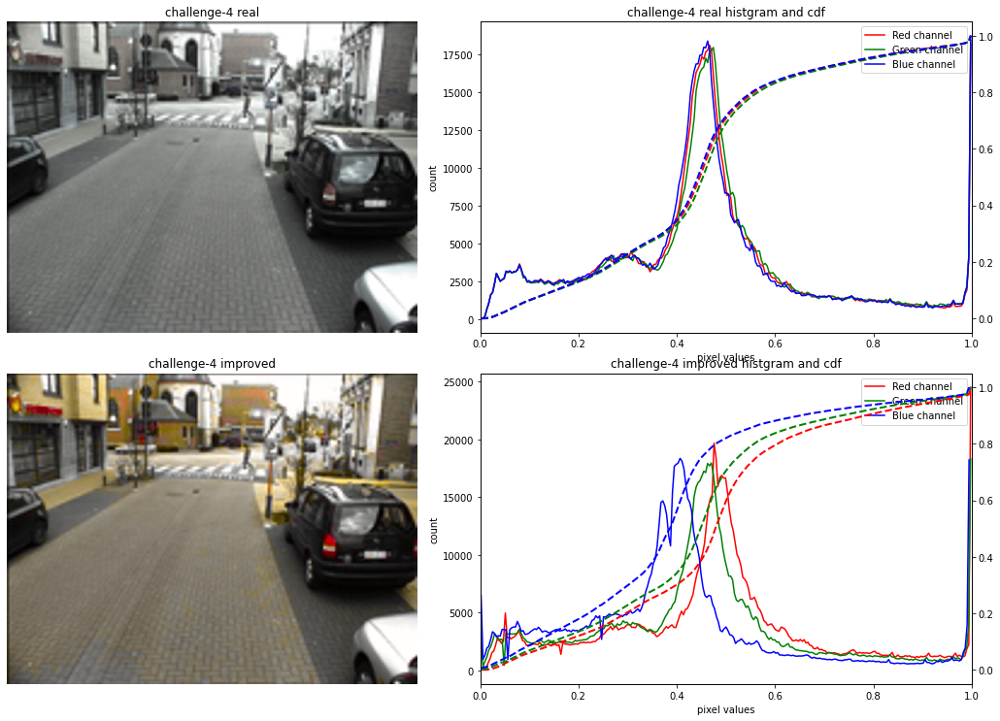

In [77]:
#for challenge-4 

c4_img_r = c4_img.copy()

c4_lab = color.rgb2lab(c4_img_r)


for i in range (1,3):
  c4_lab [:,:,i] = exposure.equalize_adapthist(c4_lab [:,:,i]/100,kernel_size=(100,100),clip_limit=0.01)*100


c4_img_r = color.lab2rgb(c4_lab)



plot_clng_img_hist(c4_img, c4_img_r, 'challenge-4 real', 'challenge-4 improved', nbins=256, normalize=False, plot_cdf=True)

### END SOLUTION